## Distance Calculations

## Internal Validation
Often in clustering we will use eucledian distance when calculating our clusters, but other options for distance metrics are available.

Good options to consider: 

Euclidean (or L2): 
$\sqrt (\sum_{i=1}^n (X_i - Y_i)^2 )$

Manhattan (or L1):
$\sum_{i=1}^n \mid X_i - Y_i\mid$

Minkowski distance:
A combination Euclidean and Manhattan with a specificed P where P=1 is Manhattan and P=2 is Euclidean

$ (\sum_{i=1}^n \mid X_i - Y_i\mid^p)^1/p $

Cosine: 
Similar of vectors
$ \sqrt \sum_{i=1}^n x_i y_i  /  \sqrt \sum_{i=1}^n x_i^2 \sum_{i=1}^n y_i^2 $

Mahalanobis
Similary of points in correlated space

$ \sqrt (x-y)^T S^-1 (x-y) $

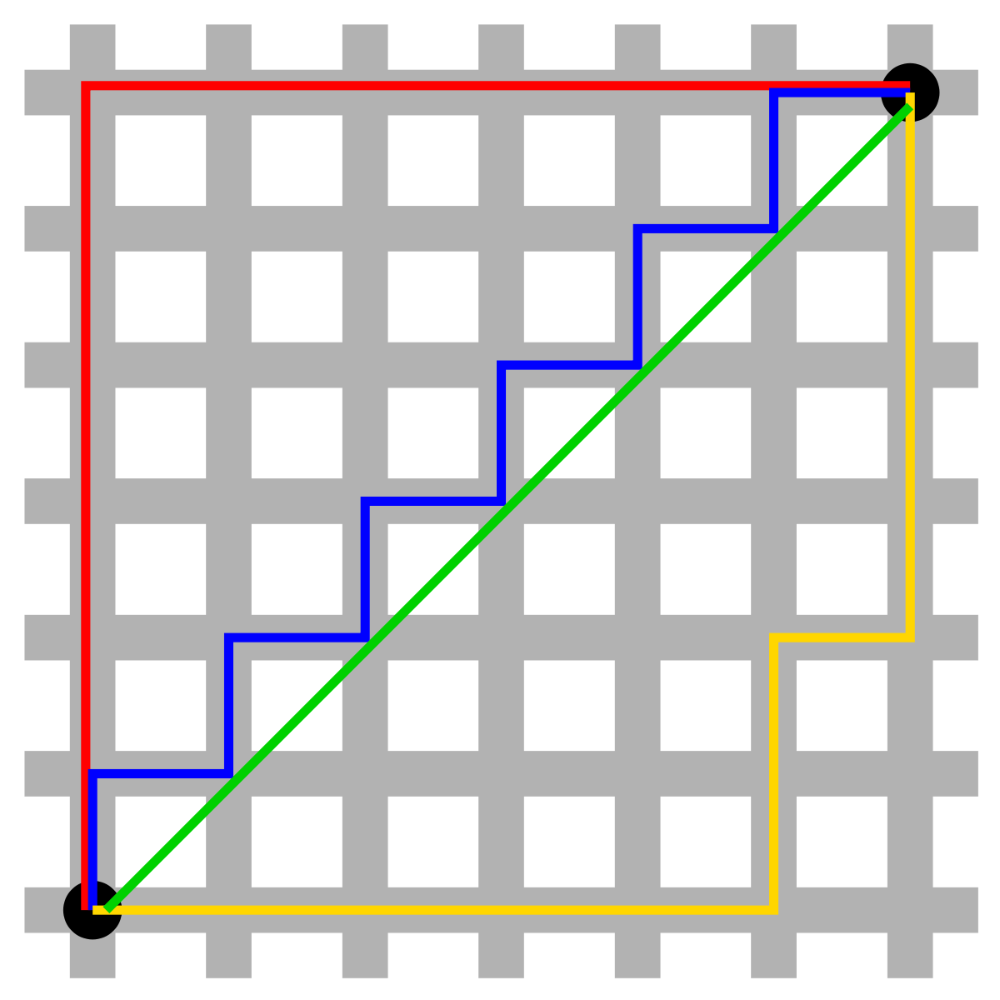

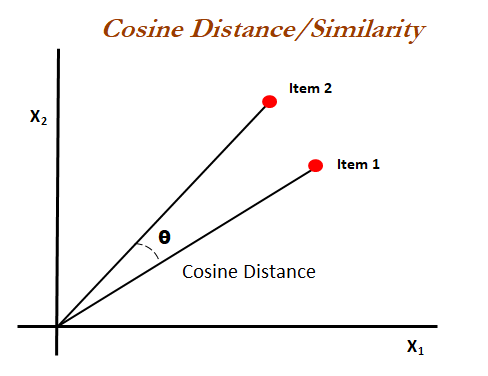

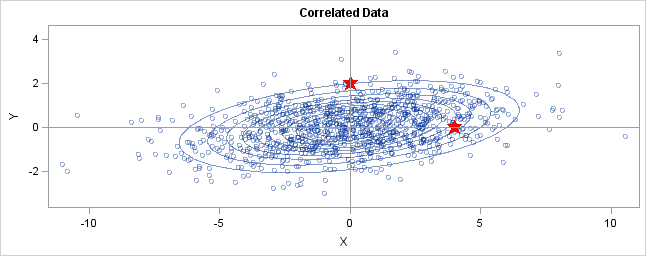

# Clustering Techniques

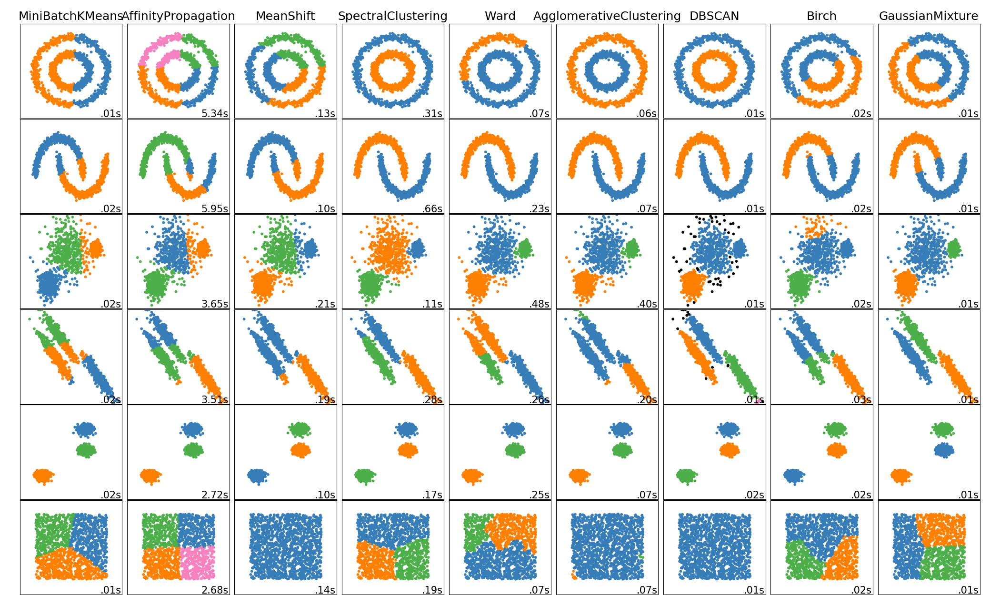

__Stochastic vs Deterministic: What's the difference!__

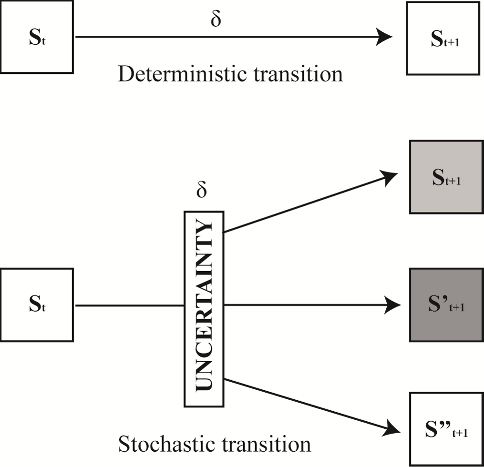

Typically a time-series notation, but is useful to consider when examining clustering - is the result the effect of a repeatable and __predictable__ pattern or a randomized solution

Think- does the weather depend on today or on some function of time.

__Metric vs Non-Metric: What's the difference!__

Metric: Useful techniques when distance between observations should be preserved- think continous values where we are intrested in scale such as earthquake scale.

Non-metric: Useful techniques when distance is not meaningful but order should be preserved- think ordinal or categorical values such as a Likert scale.

# Manifold Learning

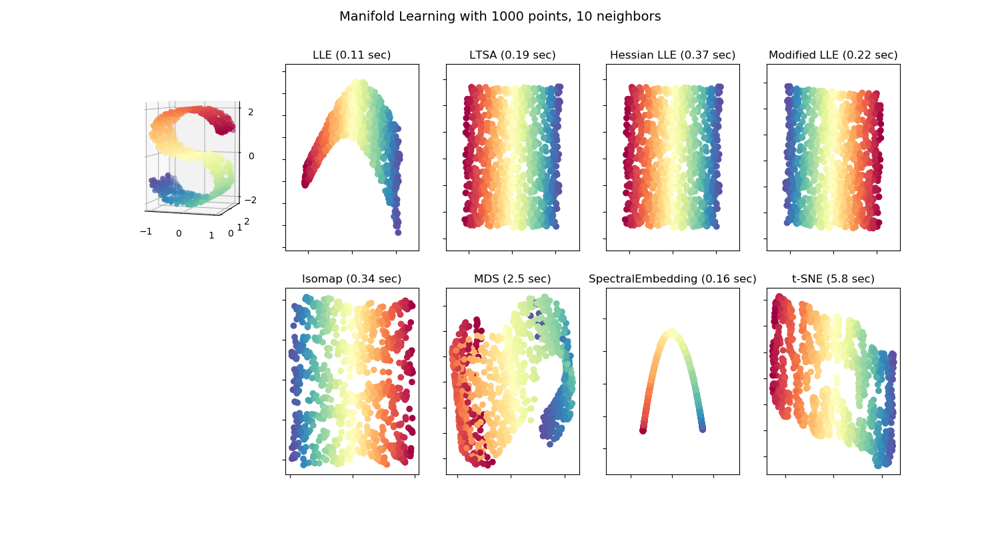

An approach to non-linear dimensionality reduction. Family of techniques similar to PCA.

Manifold learning is instead an idea to generalize and apply results to non-linear data.



# Spectral Clustering

Similarity matrix clustering: What is a similarity matrix??? (Stochastic)

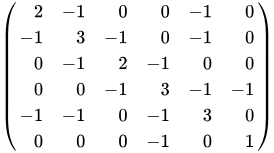

Spectral clustering treats data-points as nodes on a graph and preforms K-Means on the relevant eigenvectors of a Laplacian matrix. The goal is to find a good (low dimensional) embedding of the graph in Eucledian space. A sort of manifold learning technique! From there K-means is typically run. 

Spectral clustering can be supplied with a precomputed distance matrix!

__STEPS__
1. Compute a similarity matrix (adjacency matrix) and generate a graph representation
2. Project onto a lower dimensional space and find appropiate eigenvectors
3. Create clusters on the eigenvectors with k-means

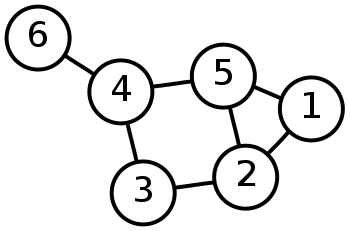

# HDBSCAN

Density-based spatial clustering of applications with noise (DBSCAN)
Deterministic Clustering (Mostly)

DBSCAN works through dividing the dataset into n dimensions, then forms a dimensional shape around the datapoint and counting the number of points within that shape.

DBSCAN counts this as a cluster and will expand the shape by counting the number of nearby datapoints. 

DBSCAN requires two parameters: 
Number of data points to determine a single cluster (min data) 
Distance between datapoints within a cluster

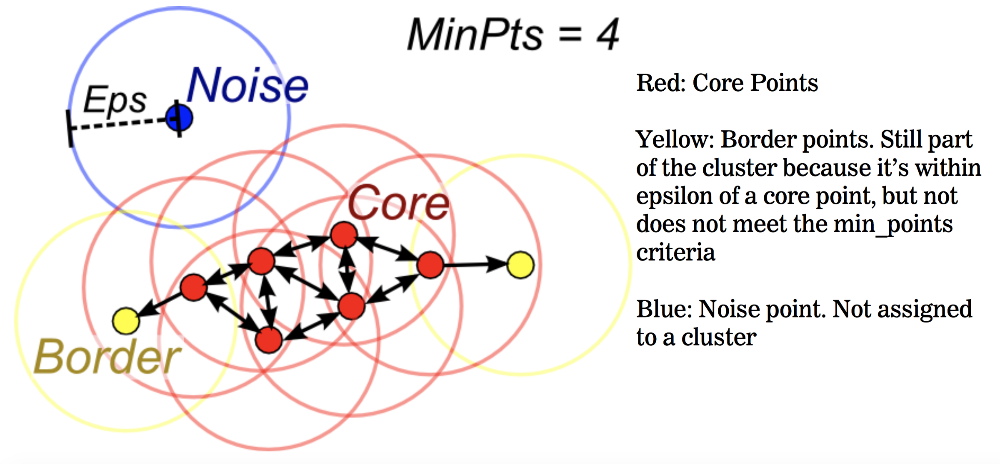

Core points are identified as having at least the mininum number of datapoints within the radius of the epsilon.



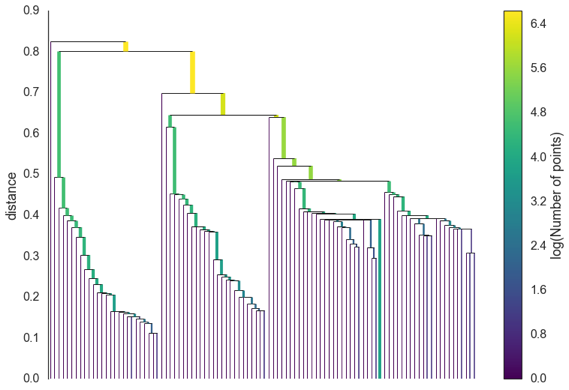

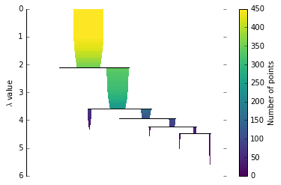

HDBSCAN allows for data points to fall off of the cluster. The advantage of this is the ability to allow for varying density based clusters.  

In [1]:
pwd

'/Users/brbonham/OneDrive - Deloitte (O365D)/MLGuild_apprentices/mlg-03-us-master/day_4/code'

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn.cluster as cluster
import time
%matplotlib inline
sns.set_context('poster')
sns.set_color_codes()
plot_kwds = {'alpha' : 0.25, 's' : 80, 'linewidths':0}

In [3]:
data = np.load('../data/clusterable_data.npy')

print(data)

[[-0.12153499 -0.22876337]
 [-0.22093687 -0.25251088]
 [ 0.1259037  -0.27314321]
 ..., 
 [ 0.50243143 -0.3002958 ]
 [ 0.53822256  0.19412199]
 [-0.08688887 -0.2092721 ]]


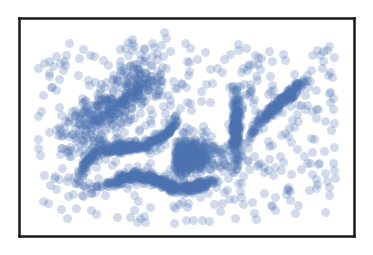

In [4]:
plt.scatter(data.T[0], data.T[1], c='b', **plot_kwds)
frame = plt.gca()
frame.axes.get_xaxis().set_visible(False)
frame.axes.get_yaxis().set_visible(False)

__Don’t be wrong!:__ If you are doing EDA you are trying to learn and gain intuitions about your data. In that case
it is far better to get no result at all than a result that is wrong. Bad results lead to false intuitions which in turn send you down completely the wrong path. Not only do you not understand your data, you misunderstand your
data. This means a good EDA clustering algorithm needs to conservative in int’s clustering; it should be willing
to not assign points to clusters; it should not group points together unless they really are in a cluster; this is true of far fewer algorithms than you might think.

__Intuitive Parameters:__ All clustering algorithms have parameters; you need some knobs to turn to adjust things.
The question is: how do you pick settings for those parameters? If you know little about your data it can be hard
to determine what value or setting a parameter should have. This means parameters need to be intuitive enough
that you can hopefully set them without having to know a lot about your data.

__Stable Clusters:__ If you run the algorithm twice with a different random initialization, you should expect to
get roughly the same clusters back. If you are sampling your data, taking a different random sample shouldn’t
radically change the resulting cluster structure (unless your sampling has problems). If you vary the clustering
algorithm parameters you want the clustering to change in a somewhat stable predictable fashion.

__Performance:__ Data sets are only getting bigger. You can sub-sample (but see stability), but ultimately you need
a clustering algorithm that can scale to large data sizes. A clustering algorithm isn’t much use if you can only
use it if you take such a small sub-sample that it is no longer representative of the data at large!

In [5]:
def plot_clusters(data, algorithm, args, kwds):
    start_time = time.time()
    labels = algorithm(*args, **kwds).fit_predict(data)
    end_time = time.time()
    palette = sns.color_palette('deep', np.unique(labels).max() + 1)
    colors = [palette[x] if x >= 0 else (0.0, 0.0, 0.0) for x in labels]
    plt.scatter(data.T[0], data.T[1], c=colors, **plot_kwds)
    frame = plt.gca()
    frame.axes.get_xaxis().set_visible(False)
    frame.axes.get_yaxis().set_visible(False)
    plt.title('Clusters found by {}'.format(str(algorithm.__name__)), fontsize=24)
    plt.text(-0.5, 0.7, 'Clustering took {:.2f} s'.format(end_time - start_time), fontsize=14)

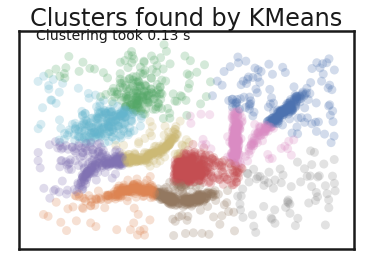

In [13]:
plot_clusters(data, cluster.KMeans, (), {'n_clusters':10})

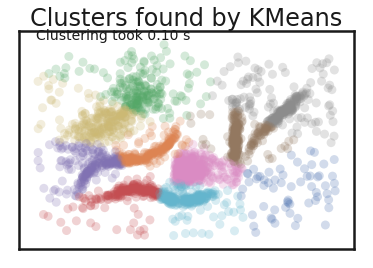

In [14]:
plot_clusters(data, cluster.KMeans, (), {'n_clusters':10})

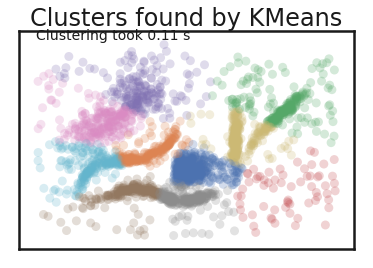

In [15]:
plot_clusters(data, cluster.KMeans, (), {'n_clusters':10})

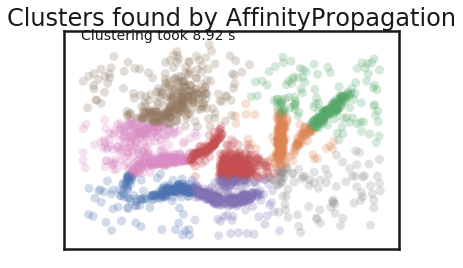

In [8]:
plot_clusters(data, cluster.AffinityPropagation, (), {'preference':-5.0, 'damping':0.95})

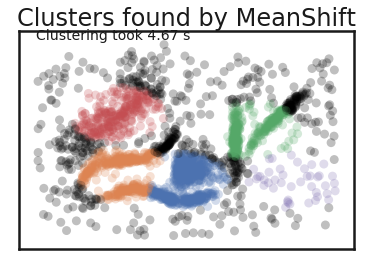

In [9]:
plot_clusters(data, cluster.MeanShift, (0.175,), {'cluster_all':False})

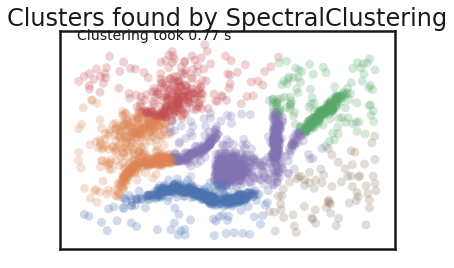

In [10]:
plot_clusters(data, cluster.SpectralClustering, (), {'n_clusters':6})

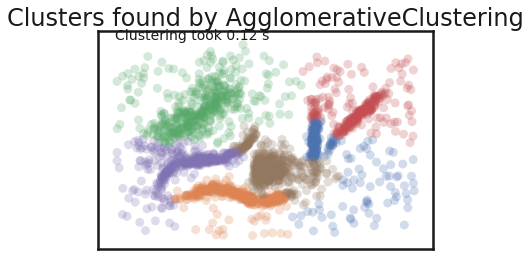

In [11]:
plot_clusters(data, cluster.AgglomerativeClustering, (), {'n_clusters':6, 'linkage':'ward'})

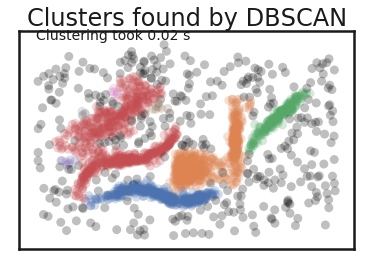

In [12]:
plot_clusters(data, cluster.DBSCAN, (), {'eps':0.025})

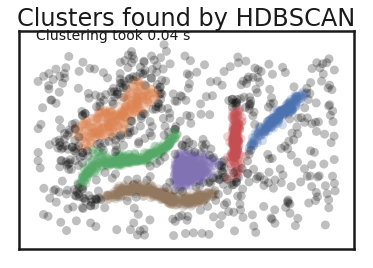

In [13]:
import hdbscan
plot_clusters(data, hdbscan.HDBSCAN, (), {'min_cluster_size':15})

So what do we think? Which clustering algorithm made the most sense to you?

Don’t be wrong!: If you are doing EDA you are trying to learn and gain intuitions about your data. In that case it is far better to get no result at all than a result that is wrong. Bad results lead to false intuitions which in turn send you down completely the wrong path. Not only do you not understand your data, you misunderstand your data. This means a good EDA clustering algorithm needs to conservative in int’s clustering; it should be willing to not assign points to clusters; it should not group points together unless they really are in a cluster; this is true of far fewer algorithms than you might think.

Intuitive Parameters: All clustering algorithms have parameters; you need some knobs to turn to adjust things. The question is: how do you pick settings for those parameters? If you know little about your data it can be hard to determine what value or setting a parameter should have. This means parameters need to be intuitive enough that you can hopefully set them without having to know a lot about your data.

Stable Clusters: If you run the algorithm twice with a different random initialization, you should expect to get roughly the same clusters back. If you are sampling your data, taking a different random sample shouldn’t radically change the resulting cluster structure (unless your sampling has problems). If you vary the clustering algorithm parameters you want the clustering to change in a somewhat stable predictable fashion.

Performance: Data sets are only getting bigger. You can sub-sample (but see stability), but ultimately you need a clustering algorithm that can scale to large data sizes. A clustering algorithm isn’t much use if you can only use it if you take such a small sub-sample that it is no longer representative of the data at large!

# Ensemble Clustering

Clustering can have a lot of options. How many clusters do I specify?  What type of distance calculation should I use?

Enter - 
## Democracy

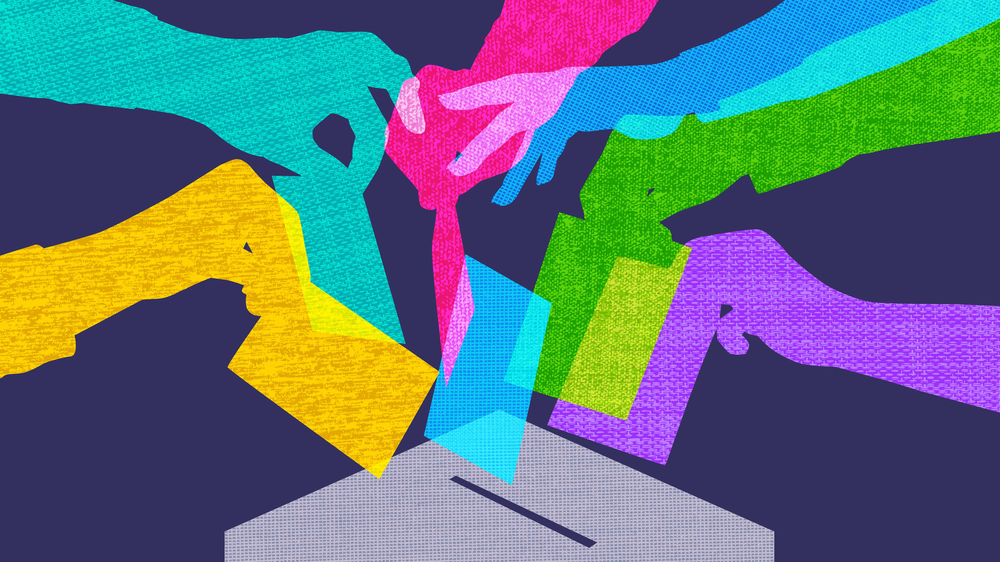

Ensemble Clustering utilizes majority vote to determine clusters. This means that if a two data points are in the same cluster more than x times (vote percentage), then they are determined to be in the same cluster. Ensemble clustering to find true relationships that may be hidden, and will often work for determining the correct number of clusters!

What will happen if we run ensemble clustering with a stochastic model?
What about deterministic?

In [15]:
import sys
!{sys.executable} -m pip install openensembles

conda Env List
conda create --name OpenEnsembles python=3.6 numpy=1.11.3 networkx=1.11 matplotlib=2.0.0 pandas=0.19.2 scipy=0.18.1 scikit-learn=0.19.1 spyder jupyter
conda activate OpenEnsembles
conda config --add channels conda-forge 
conda install -c naeglelab openensembles
conda install -c conda-forge hdbscan 
conda install seaborn


SyntaxError: invalid syntax (<ipython-input-15-ae53be4d4db0>, line 4)

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn import datasets
import numpy as np
import openensembles as oe

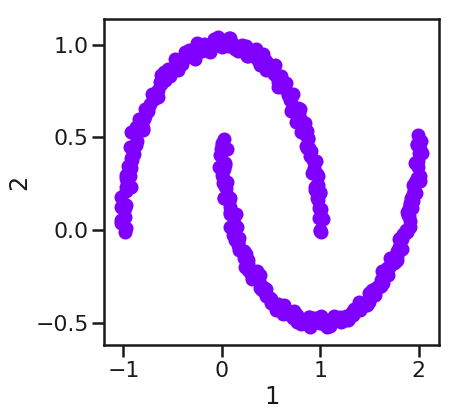

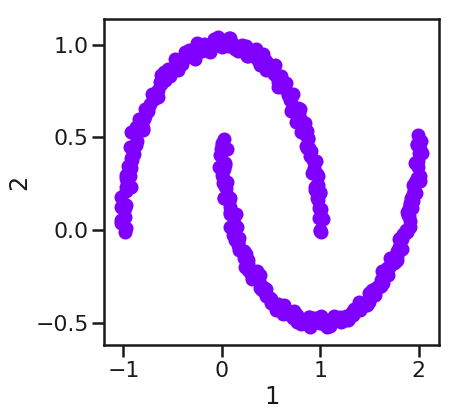

In [19]:
n_samples = 400
X, y = datasets.make_moons(n_samples=n_samples, shuffle=True, noise=0.02, random_state=None)
df = pd.DataFrame(X)

dataObj = oe.data(df, [1,2])
dataObj.plot_data('parent')

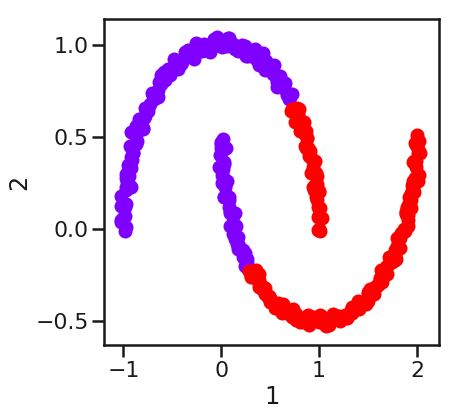

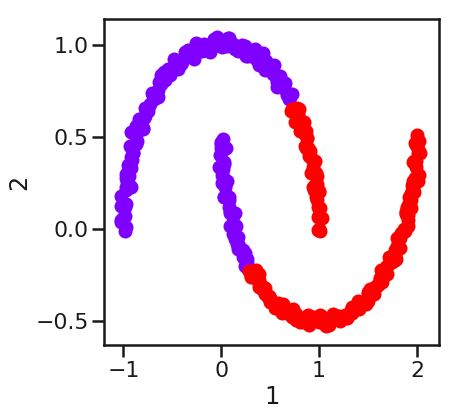

In [20]:
c = oe.cluster(dataObj) 
K = 2
name = 'kmeans'
c.cluster('parent', 'kmeans', name, K, init = 'random', n_init = 1)
dataObj.plot_data('parent', class_labels=c.labels['kmeans'])

In [22]:
# Build towards a majority voting that finds the two continuous partitions
c = oe.cluster(dataObj) 
K = 10 
numIterations = 40
c_MV_arr = []
modulo = 1 #if you want to calculate majority vote only ever other or few solutions, increase this number
sil_arr = []
det_arr = []
num_clusters = []

# Wrapper function for running an iteration
def run_cluster_iteration(c, i):
    name = 'kmeans_' + str(i)
    c.cluster('parent', 'kmeans', name, K, init = 'random', n_init = 1)
    return c

def run_val_iteration(c, i):
    #take a slice of the ensemble of size i
    names = list(c.labels.keys())
    cSlice = c.slice(names[0:i])
    
    x = cSlice.finish_majority_vote(threshold=0.5)
    v = oe.validation(dataObj, x)

    #A compactness metric
    validation_name = 'silhouette'
    v.calculate(validation_name, 'majority_vote', 'parent')
    name = validation_name+'_parent_majority_vote'
    sil_val = v.validation[name]

    #A metric for connectedness
    validation_name = 'det_ratio'
    v.calculate(validation_name, 'majority_vote', 'parent')
    name = validation_name+'_parent_majority_vote'
    det_val = v.validation[name]

    return (x, len(x.clusterNumbers['majority_vote']), sil_val, det_val)

    
# Use python's multiprocessing module to run in parallel
from multiprocessing import Pool
N_THREADS = 4
pool = Pool(processes=N_THREADS)

# Run clustering in parallel
cluster_apply_results = [pool.apply_async(run_cluster_iteration, (c, i)) for i in range(1, numIterations)]
cluster_results = [x.get() for x in cluster_apply_results]

# Merge the results
#First, establish a non-empty parent cluster to merge remainder of iterations with (which are an array of cluster objects)
c = cluster_results[0]
cluster_td = c.merge(cluster_results[1:])

# Run validation in parallel -- calculate majority vote for every possible slice of c 
val_apply_results = [pool.apply_async(run_val_iteration, (c, i)) for i in range(1, numIterations) if not i % modulo]
val_results = [x.get() for x in val_apply_results]
#val_results = [run_val_iteration(c, i) for i in range(1, numIterations) if not i % modulo]

# Merge the results
for r in val_results:
    c_MV_arr.append(r[0])
    num_clusters.append(r[1])
    sil_arr.append(r[2])
    det_arr.append(r[3])

/anaconda3/envs/OpenEnsembles/lib/python3.6/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/anaconda3/envs/OpenEnsembles/lib/python3.6/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/envs/OpenEnsembles/lib/python3.6/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/anaconda3/envs/OpenEnsembles/lib/python3.6/site-packages/numpy/core/_methods.py:59: RuntimeWarning: Mean of empty slice.
  warnings.warn("Mean of empty slice.", RuntimeWarning)
/anaconda3/envs/OpenEnsembles/lib/python3.6/site-packages/numpy/core/_methods.py:70: RuntimeWarning: invalid value encountered in double_scalars
  ret = ret.dtype.type(ret / rcount)
/anaconda3/envs/OpenEnsembles/lib/python3.6/site-packages/numpy/core/_methods.py:70: RuntimeWarning: i

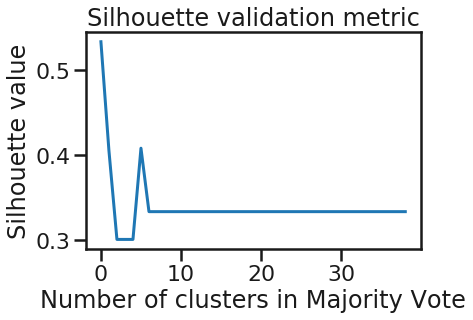

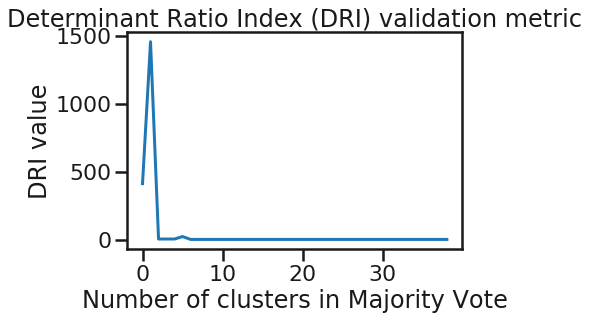

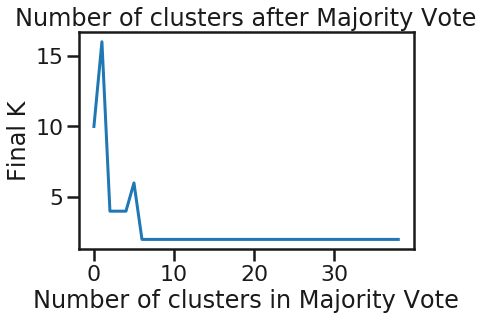

In [20]:
#Compactness
plt.plot(sil_arr)
plt.title('Silhouette validation metric')
plt.xlabel('Number of clusters in Majority Vote')
plt.ylabel('Silhouette value')
plt.show()

#Connectedness
plt.plot(det_arr)
plt.title('Determinant Ratio Index (DRI) validation metric')
plt.xlabel('Number of clusters in Majority Vote')
plt.ylabel('DRI value')
plt.show()

#Convergence towards final K
plt.plot(num_clusters)
plt.xlabel('Number of clusters in Majority Vote')
plt.ylabel('Final K')
plt.title('Number of clusters after Majority Vote')
plt.show()

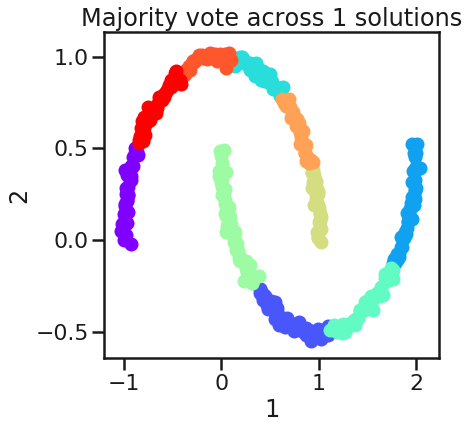

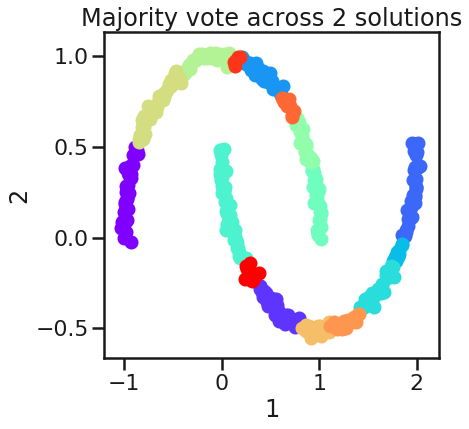

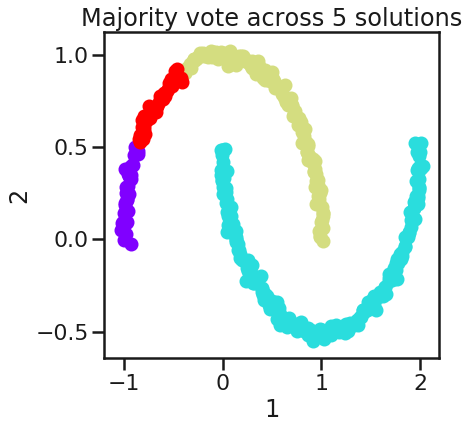

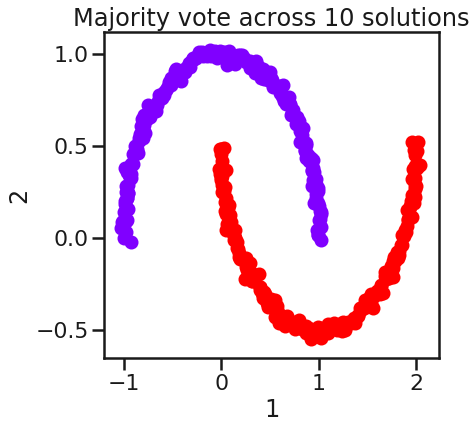

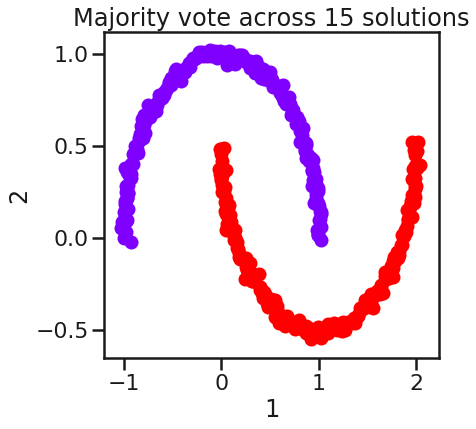

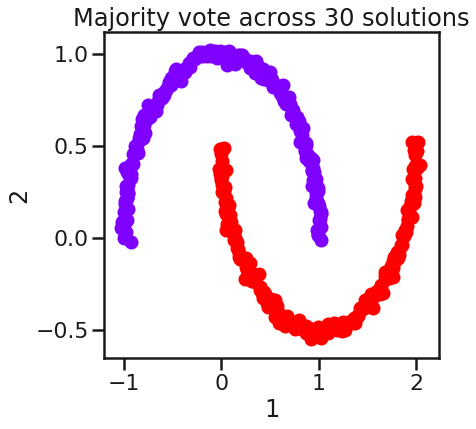

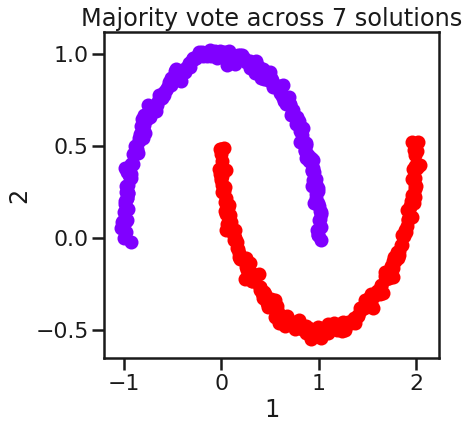

In [21]:
#Plot some span of solutoins, including the one that minimizes connectedness 
import operator
idx, value = min(enumerate(det_arr), key=operator.itemgetter(1)) #Where the connectedness metric minimized

toPlot = [0, 1, 4, 9, 14, 29, idx]
for ind in toPlot:

    fig = dataObj.plot_data('parent', class_labels=c_MV_arr[ind].labels['majority_vote'])
    plt.title('Majority vote across %d solutions'%(ind+1))
    plt.show()

# K-Prototypes

__What about categorical variables????__

I should probably just one-hot encode it and move on: Right?


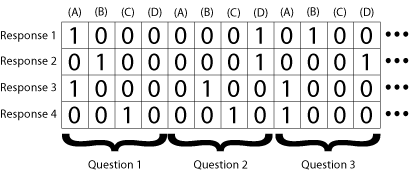

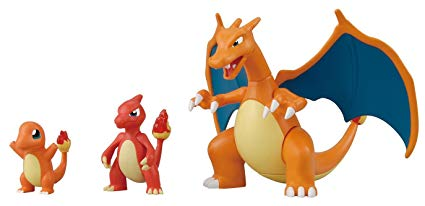

Similarity matrix is an algoirthm that deduces how similar two objects are. In this image, we could run with any similarity metric from these being identical, or trying to incorporate the different stages and levels. 

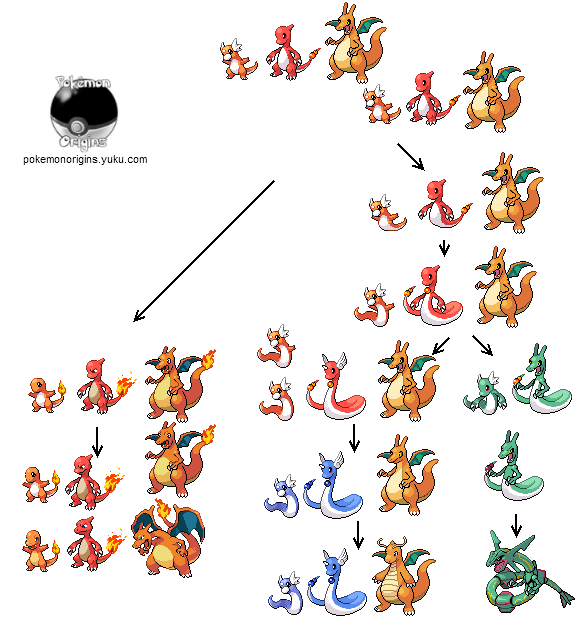

The k-modes algorithm uses a simple matching dissimilarity measure to deal with categorical objects, replaces the means of clusters with modes, and uses a frequency-based method to update modes in the clustering process to minimise the clustering cost function. With these extensions the k-modes algorithm enables the clustering of categorical data in a fashion similar to k-means. The k-prototypes algorithm, through the definition of a combined dissimilarity measure, further integrates the k-means and k-modes algorithms to allow for clustering objects described by mixed numeric and categorical attributes. Zhexue Huang- Extensions to the k-Means Algorithm for Clustering Large Data Sets with Categorical Values

K-Modes

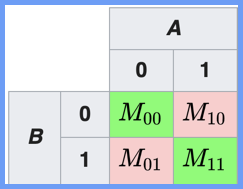

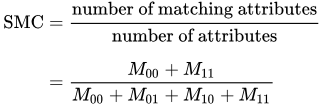

The k-modes algorithm uses a simple matching dissimilarity measure to deal with categorical objects, replaces the means of clusters with modes, and uses a frequency-based method to update modes in the clustering process to minimise the clustering cost function. With these extensions the k-modes algorithm enables the clustering of categorical data in a fashion similar to k-means. The k-prototypes algorithm, through the definition of a combined dissimilarity measure, further integrates the k-means and k-modes algorithms to allow for clustering objects described by mixed numeric and categorical attributes. Zhexue Huang- Extensions to the k-Means Algorithm for Clustering Large Data Sets with Categorical Values

K-Modes

K-Prototypes: 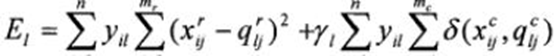

1–1st cluster
r — Numerical attributes
c — Categorical attributes
yi1 — Object Xi belongs to the cluster 1
xi1 — jth attribute
qij — jth attribute of the prototype in cluster 1
mr — No.of Numerical attributes
mc — No.of categorical attributes
m = mr + mc
r1 — Weight of the categorical attribute in cluster 1
If r1 is small, it indicates that the clustering is dominated by numerical attributes
If r1 is large, it indicates that the clustering is dominated by categorical attributes
E1= Minimum sum of the difference of all the elements and the prototypes in cluster 1
E1r= Minimum sum of the difference of the numerical attributes of all the elements and the prototypes in cluster 1
E1c= Minimum sum of the difference of the categorical attributes of all the elements and the prototypes in cluster 1

I wonder if I could run an ensemble of K-Prototypes - handle all my data natively and be done with clustering??? 

Or wait! 

I can take the dissimilarity metric from K-Prototypes, compute a precomputed similarity matrix, and then run ensemble spectral clustering!

# High-five we did clustering!


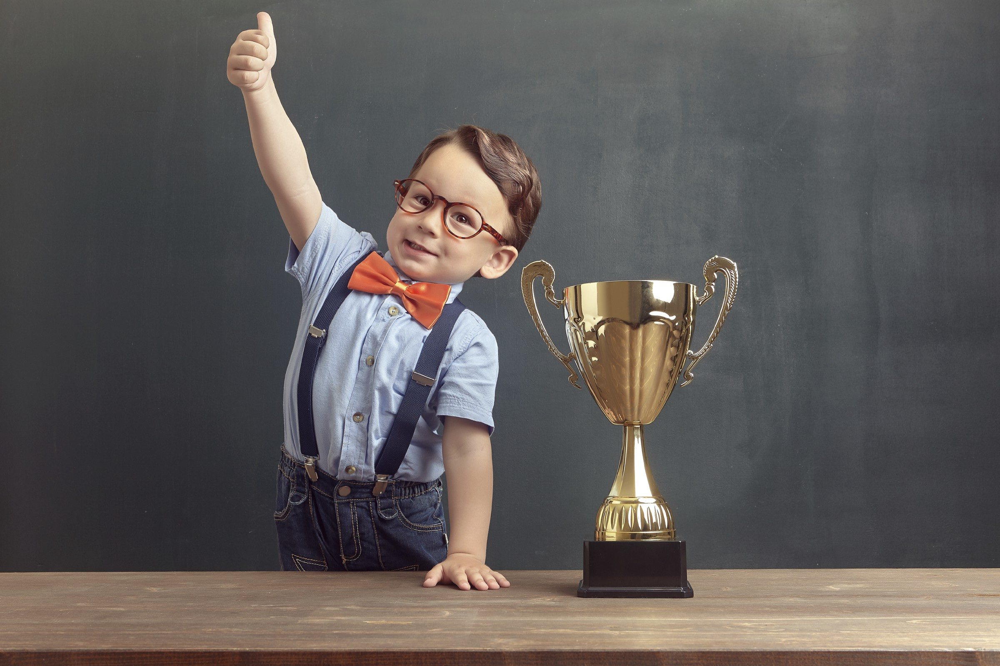